# Fourier Transform

### High and Low Pass Filter
HPF: HPF is used to sharpen the image by attenuating the low frequency. When the impulse response or signal is passed through a high pass filter, an HPF mainly allows high frequencies to pass through. As High pass filters are used for sharpening the images, the frequency obtained is less compared to the cut-off frequency(ωc). In OpenCV and in digital image processing we also use HPF functionality to find the edges in an image. 

LPF: Actually, a low-pass filter is just a gray-scale image, whose values are higher near the center, and close to zero outside. Therefore, low-pass filters usually look like the following image. 

#### Importing Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
from scipy import ndimage
from scipy import signal
from matplotlib.pyplot import imshow
from PIL import Image
import cv2
from scipy import signal
from scipy.fftpack import fft2, fftshift, ifftshift, ifft2

#### Importing Images

In [2]:
new_im=cv2.imread("Leaves.jpg")

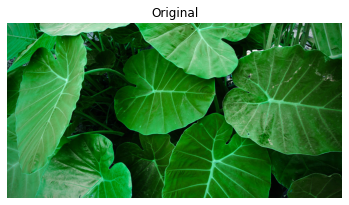

In [3]:
plt.imshow(new_im, cmap='gray'),plt.title('Original')
plt.axis('off')
plt.show()

#### Converting to grayscale

In [4]:
gray_img = cv2.cvtColor(new_im, cv2.COLOR_BGR2GRAY)

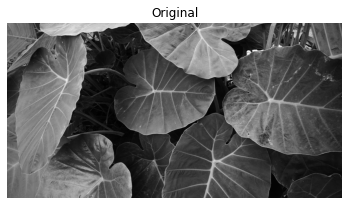

In [5]:
plt.imshow(gray_img, cmap='gray'),plt.title('Original')
plt.axis('off')
plt.show()

In [8]:
cv2.imwrite("gray_img.jpg", gray_img)

True

## Fourier Transform

#### Reference:

https://www.youtube.com/watch?v=YVBxM64kpkU

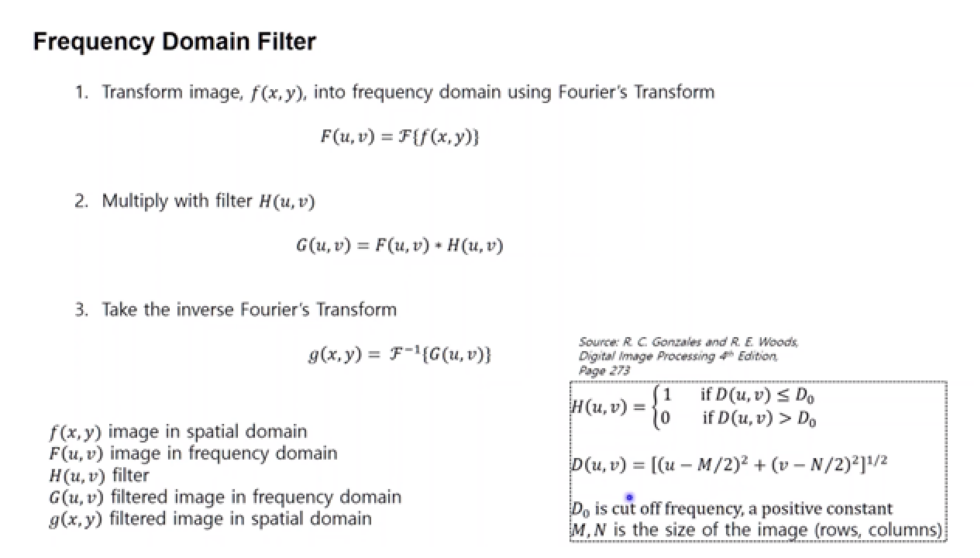

In [49]:
theory = cv2.imread("theory.png")
plt.figure(figsize=(20,10))
plt.imshow(theory, cmap='gray')
plt.axis('off')
plt.show()

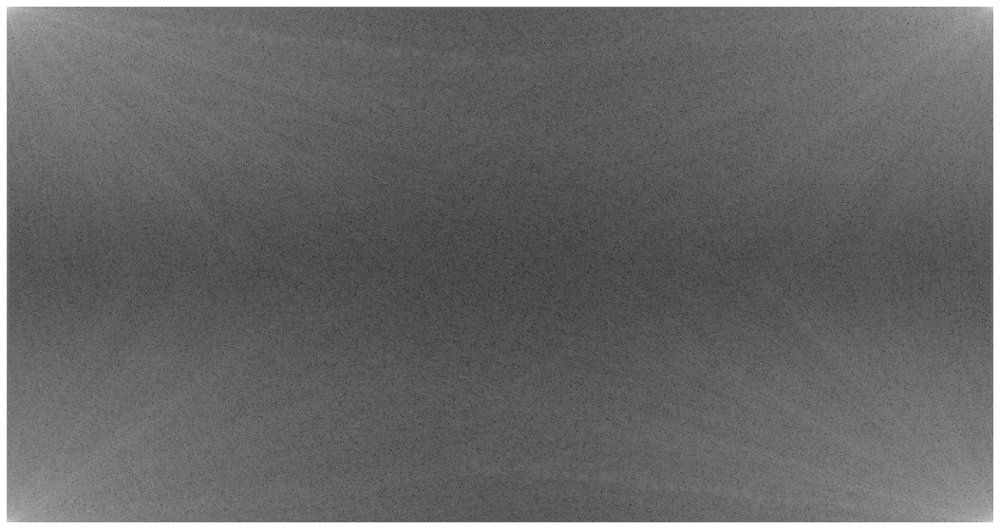

In [11]:
# converting image into frequency domain
F = np.fft.fft2(gray_img)
plt.figure(figsize =(20,10))
plt.imshow(np.log1p(np.abs(F)), 
           cmap='gray')
plt.axis('off')
plt.show()

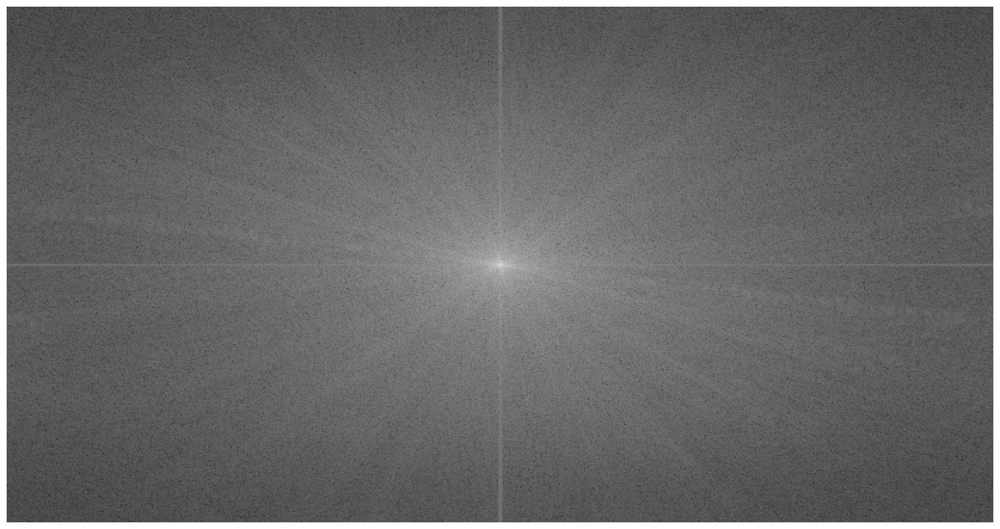

In [12]:
#getting the spectrum
Fshift = np.fft.fftshift(F)
plt.figure(figsize =(20,10))
plt.imshow(np.log1p(np.abs(Fshift)), 
           cmap='gray')
plt.axis('off')
plt.show()

In [13]:
#Creating the low pass filter
M,N = gray_img.shape
H = np.zeros((M,N), dtype=np.float32)
D0 = 50
for u in range(M):
    for v in range(N):
        D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
        if D <= D0:
            H[u,v] = 1
        else:
            H[u,v] = 0

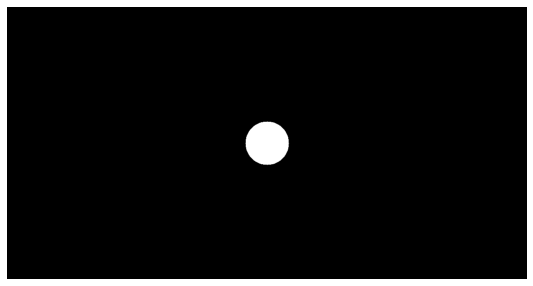

In [16]:
plt.figure(figsize =(10,5))
plt.imshow(H, cmap='gray')
plt.axis('off')
plt.show()

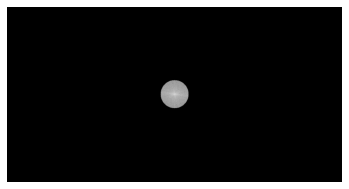

In [39]:
# Multiplying Filter with Fshift
Gshift = Fshift * H
plt.imshow(np.log1p(np.abs(Gshift)), 
           cmap='gray')
plt.axis('off')
plt.show()

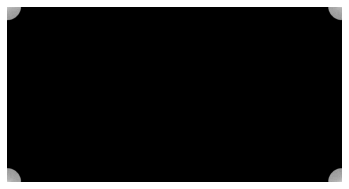

In [41]:
# Inverse Fourier Transform
G = np.fft.ifftshift(Gshift)
plt.imshow(np.log1p(np.abs(G)), 
           cmap='gray')
plt.axis('off')
plt.show()

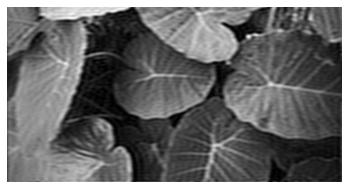

In [42]:
g = np.abs(np.fft.ifft2(G))
plt.imshow(g, cmap='gray')
plt.axis('off')
plt.show()

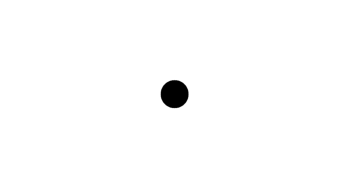

In [43]:
# Filter: High pass filter
H = 1 - H

plt.imshow(H, cmap='gray')
plt.axis('off')
plt.show()

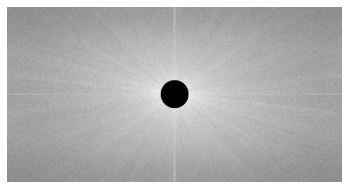

In [44]:
# Ideal High Pass Filtering
Gshift = Fshift * H
plt.imshow(np.log1p(np.abs(Gshift)), 
           cmap='gray')
plt.axis('off')
plt.show()

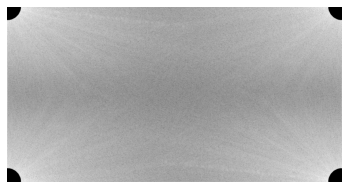

In [45]:
# Inverse Fourier Transform
G = np.fft.ifftshift(Gshift)
plt.imshow(np.log1p(np.abs(G)), 
           cmap='gray')
plt.axis('off')
plt.show()

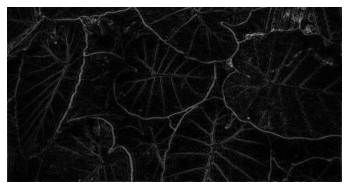

In [46]:
g = np.abs(np.fft.ifft2(G))
plt.imshow(g, cmap='gray')
plt.axis('off')
plt.show()

### Ideal LPF Function

In [50]:
def ideal_lpf(image):
    new_im=cv2.imread(image)
    gray_img = cv2.cvtColor(new_im, cv2.COLOR_BGR2GRAY)
    F = np.fft.fft2(gray_img)
    Fshift = np.fft.fftshift(F)
    M,N = gray_img.shape
    H = np.zeros((M,N), dtype=np.float32)
    D0 = 50
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            if D <= D0:
                H[u,v] = 1
            else:
                H[u,v] = 0
    Gshift = Fshift * H
    G = np.fft.ifftshift(Gshift)
    g = np.abs(np.fft.ifft2(G))
    return g

In [51]:
ideal_lpf_img = ideal_lpf("leaves.jpg")

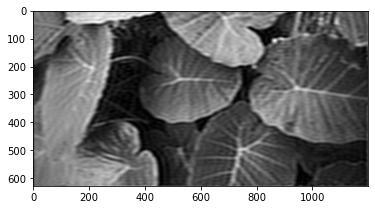

In [53]:
imshow(ideal_lpf_img, cmap = "gray")

### Ideal HPF Function

In [83]:
def ideal_hpf(image):
    new_im=cv2.imread(image)
    gray_img = cv2.cvtColor(new_im, cv2.COLOR_BGR2GRAY)
    F = np.fft.fft2(gray_img)
    Fshift = np.fft.fftshift(F)
    M,N = gray_img.shape
    H = np.zeros((M,N), dtype=np.float32)
    D0 = 50
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            if D <= D0:
                H[u,v] = 1
            else:
                H[u,v] = 0
    H = 1 - H
    # Ideal High Pass Filtering
    Gshift = Fshift * H
    G = np.fft.ifftshift(Gshift)
    g = np.abs(np.fft.ifft2(G))
    return g

In [84]:
ideal_hpf_img = ideal_hpf("leaves.jpg")

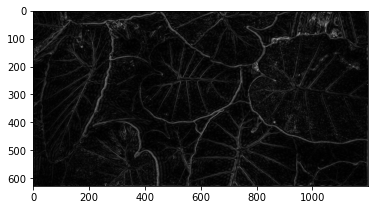

In [85]:
imshow(ideal_hpf_img, cmap="gray")

## Noise Supression

#### Resourses used: 
https://medium.com/image-vision/noise-filtering-in-digital-image-processing-d12b5266847c#:~:text=Filtering%20image%20data%20is%20a,behaviour%20and%20type%20of%20data.

https://towardsdatascience.com/image-filters-in-python-26ee938e57d2#:~:text=The%20mean%20filter%20is%20used,the%20edges%20of%20the%20image.

In [371]:
# importing image
noisy_img1 = cv2.imread("sky.png")
noisy_img2 = cv2.imread("tree.jpg")
noisy_img3 = cv2.imread("cube.png")
#noisy_img4 = cv2.imread("mypic.png")

In [372]:
# function for image plotting in rgb:
def img_convert(image):
    rgb_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return rgb_img

In [373]:
# function for comparison plotting
def plot_comparison(original_image, final_image, filter_name):
    plt.figure(figsize=(20,10))
    plt.subplot(121), plt.imshow(original_image, cmap='gray'),plt.title('Original')
    plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(final_image, cmap='gray'),plt.title(f'{filter_name} Filter')
    plt.xticks([]), plt.yticks([])
    plt.show()

#### Converting BGR to RGB

In [374]:
rgb_img1 = img_convert(noisy_img1)

In [375]:
rgb_img2 = img_convert(noisy_img2)

In [376]:
rgb_img3 = img_convert(noisy_img3)

### Gaussian Filter

In [377]:
from matplotlib import pyplot as plt
from PIL import Image, ImageFilter

In [378]:
# function for gaussian filter
def gaussian_filter(image, kernel_size):
    gaussian_blur = cv2.GaussianBlur(noisy_img1, (kernel_size, kernel_size), 0)
    return gaussian_blur

In [379]:
# applying filter
gaussian_fil = gaussian_filter(noisy_img1,3)

In [380]:
# converting to rgb for plot
final_gaussian = img_convert(gaussian_fil)

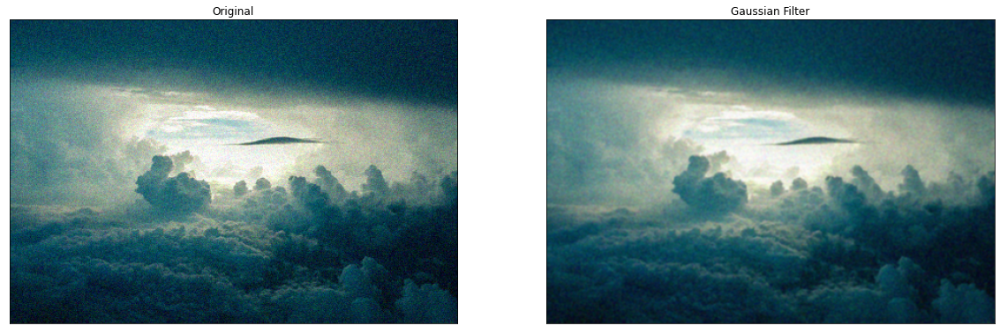

In [382]:
# plotting comparison
plot_comparison(rgb_img1, final_gaussian, "Gaussian")

### Bilateral Blur

In [383]:
# function for bilateral filter
def bilateral_filter(image, kernel_size, diameter):
    bilateral_blur = cv2.bilateralFilter(image, kernel_size, diameter, 
                                         diameter)
    return bilateral_blur

In [386]:
# applying filter
bi_fil1 = bilateral_filter(noisy_img1,9,40)
bi_fil2 = bilateral_filter(noisy_img2,9,40)
bi_fil3 = bilateral_filter(noisy_img3,11,75)

In [387]:
# converting to rgb for plot
final_blur1 = img_convert(bi_fil1)
final_blur2 = img_convert(bi_fil2)
final_blur3 = img_convert(bi_fil3)

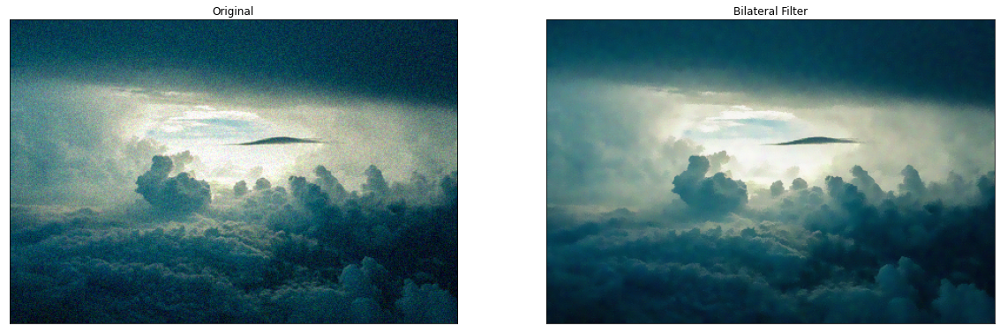

In [388]:
# plotting comparison
plot_comparison(rgb_img1, final_blur1, "Bilateral")

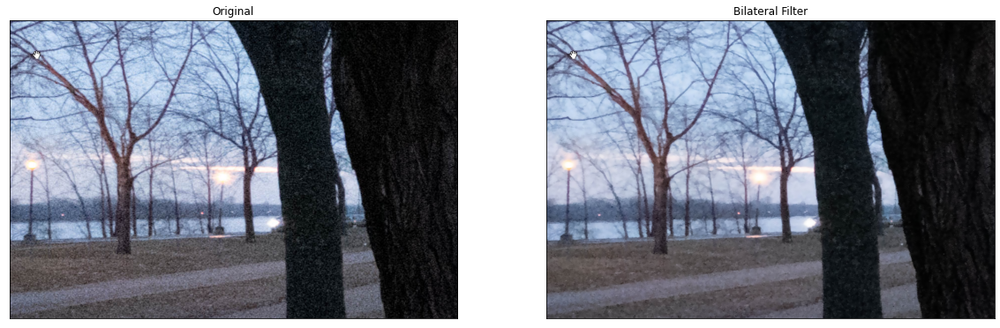

In [389]:
plot_comparison(rgb_img2, final_blur2, "Bilateral")

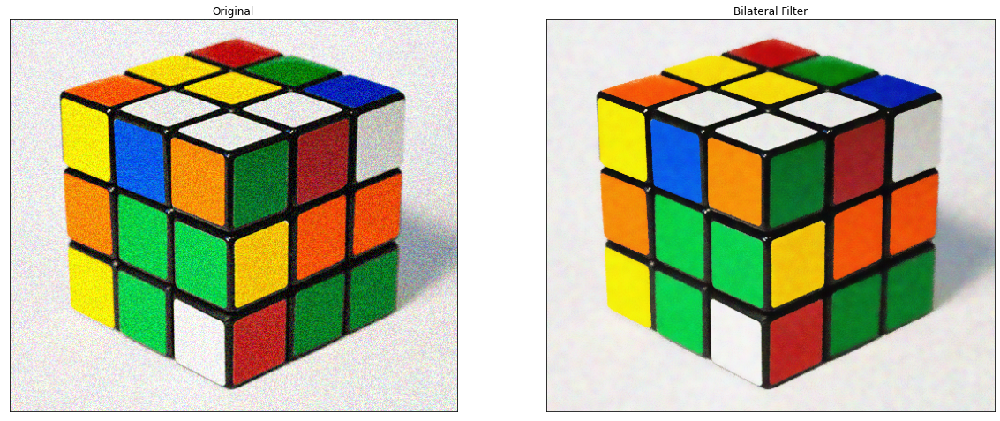

In [390]:
plot_comparison(rgb_img3, final_blur3, "Bilateral")

#### Overall Bilateral Filter is much more impressive in removing noise from images since it retains the edges unlike gaussian blur

### Edge Detection

In [391]:
image = cv2.imread("penny.jpg")

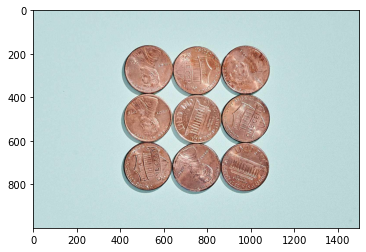

In [393]:
imshow(img_convert(image))

In [426]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

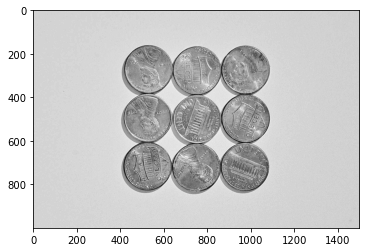

In [429]:
imshow(image_gray, cmap = 'gray')

#### Laplacian

In [430]:
lap_gray = cv2.Laplacian(image_gray, cv2.CV_64F)
lap_gray1 = np.uint8(np.absolute(lap_gray))

In [463]:
lap_gray.shape

(1000, 1500)

#### Sobel

In [464]:
sobelX = cv2.Sobel(image_gray, cv2.CV_64F, 1, 0)
sobelY = cv2.Sobel(image_gray, cv2.CV_64F, 0, 1)

sobelX = np.uint8(np.absolute(sobelX))
sobelY = np.uint8(np.absolute(sobelY))

sobel_combined = cv2.bitwise_or(sobelX, sobelY)

In [465]:
sobel_combined.shape

(1000, 1500)

#### CANNY

In [458]:
blurred = cv2.GaussianBlur(image_gray, (5, 5), 0)
canny = cv2.Canny(blurred, 30, 150)

In [459]:
canny.shape

(1000, 1500)

### Plot comparison for all Edge detectors

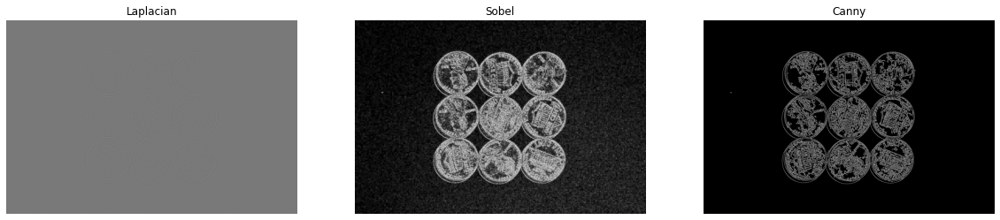

In [462]:
plt.figure(figsize=(20,10))
plt.subplot(131), plt.imshow(lap_gray, cmap='gray'),plt.title('Laplacian')
plt.axis('off')
plt.subplot(132), plt.imshow(sobel_combined, cmap='gray'),plt.title('Sobel')
plt.axis('off')
plt.subplot(133), plt.imshow(canny, cmap='gray'),plt.title("Canny")
plt.axis('off')
plt.show()

#### Of all the edge detection methods used, CANNY Edge Detector gives the most optimal results

In [466]:
# edge detection function using CANNY
def edge_detection(image_path):
    image = cv2.imread(image_path)
    # using canny edge detection 
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    canny = cv2.Canny(blurred, 30, 150)
    return canny

### Edge Detection comparison plotting

In [467]:
# importing and converting images to rgb to show as original image in plot
rgb_penny = img_convert(cv2.imread("penny.jpg"))
rgb_bottles = img_convert(cv2.imread("bottles.jpg"))
rgb_city = img_convert(cv2.imread("toronto.jpg"))
#rgb_me = img_convert(cv2.imread("mypic.png"))

In [468]:
#applying edge detection
pennys_edge = edge_detection("penny.jpg")
bottles_edge = edge_detection("bottles.jpg")
city_edge = edge_detection("toronto.jpg")

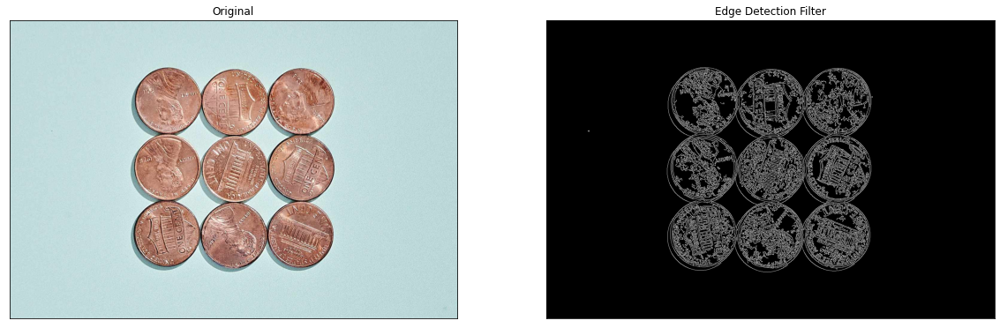

In [469]:
plot_comparison(rgb_penny, pennys_edge, "Edge Detection")

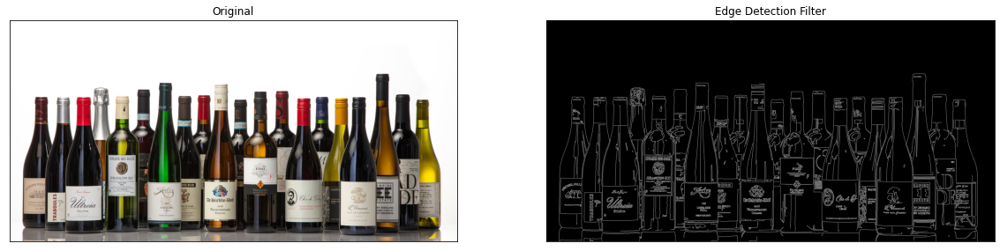

In [470]:
plot_comparison(rgb_bottles, bottles_edge, "Edge Detection")

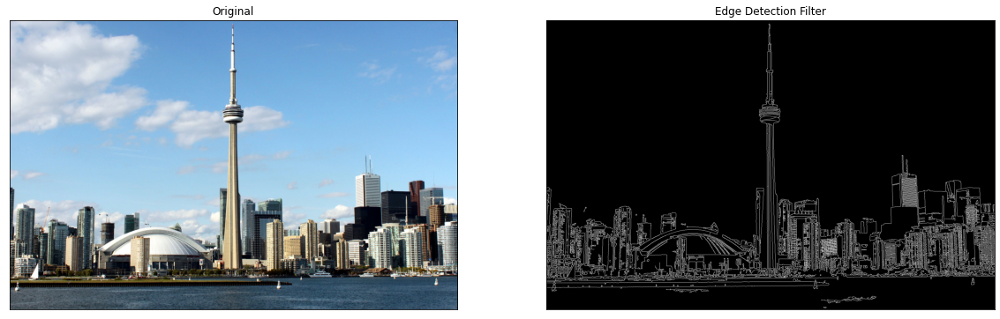

In [471]:
plot_comparison(rgb_city, city_edge, "Edge Detection")

## Creating Class for calling Filters

In [95]:
class filters:
    def __init__(self, image_path, kernel_size, diameter):
        self.image_path = image_path
        self.kernel_size = kernel_size
        self.diameter = diameter
        self.image = cv2.imread(self.image_path)
        self.gray_img = cv2.cvtColor(self.image, cv2.COLOR_BGR2GRAY)
    
    def show_original(self):
        rgb_img = cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB)
        return imshow(rgb_img)
        
    def bilateral_filter(self):
        bilateral_blur = cv2.bilateralFilter(self.image, self.kernel_size, self.diameter,self.diameter)
        rgb_bilateral = cv2.cvtColor(bilateral_blur, cv2.COLOR_BGR2RGB)
        return rgb_bilateral
    
    def ideal_hpf(self):
        F = np.fft.fft2(self.gray_img)
        Fshift = np.fft.fftshift(F)
        M,N = self.gray_img.shape
        H = np.zeros((M,N), dtype=np.float32)
        D0 = 50
        for u in range(M):
            for v in range(N):
                D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
                if D <= D0:
                    H[u,v] = 1
                else:
                    H[u,v] = 0
        H = 1 - H
        # Ideal High Pass Filtering
        Gshift = Fshift * H
        G = np.fft.ifftshift(Gshift)
        g_hpf = np.abs(np.fft.ifft2(G))
        return g_hpf
    
    def ideal_lpf(self):
        F = np.fft.fft2(self.gray_img)
        Fshift = np.fft.fftshift(F)
        M,N = self.gray_img.shape
        H = np.zeros((M,N), dtype=np.float32)
        D0 = 50
        for u in range(M):
            for v in range(N):
                D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
                if D <= D0:
                    H[u,v] = 1
                else:
                    H[u,v] = 0
        Gshift = Fshift * H
        G = np.fft.ifftshift(Gshift)
        g_lpf = np.abs(np.fft.ifft2(G))
        return g_lpf
    
    def edge_detection(self):
        # edge detection function using CANNY
        blurred = cv2.GaussianBlur(self.gray_img, (self.kernel_size, self.kernel_size), 0)
        canny = cv2.Canny(blurred, 30, 150)
        return canny
    
    def noise_adder(self):
        f = self.gray_img/255 
        x, y = f.shape
        mean = 0
        var = 0.01
        sigma = np.sqrt(var)
        n = np.random.normal(loc=mean, scale=sigma, size=(x,y))
        return f + n
    
    def plt_comp(self, filter_name):
        rgb_img = cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(20,10))
        plt.subplot(121), plt.imshow(rgb_img, cmap='gray'),plt.title('Original')
        plt.xticks([]), plt.yticks([])
        if (filter_name).lower()[0] == 'b':    
            plt.subplot(122), plt.imshow(self.bilateral_filter(), cmap='gray'),plt.title('Bilateral Filter')
        elif (filter_name).lower()[0] == 'l':
            plt.subplot(122), plt.imshow(self.ideal_lpf(), cmap='gray'),plt.title('Low Pass Filter')
        elif (filter_name).lower()[0] == 'h':
            plt.subplot(122), plt.imshow(self.ideal_hpf(), cmap='gray'),plt.title('High Pass Filter')
        elif (filter_name).lower()[0] == 'e':
            plt.subplot(122), plt.imshow(self.edge_detection(), cmap='gray'),plt.title('Edge Detection')
        elif "noise".lower() in (filter_name):
            plt.subplot(122), plt.imshow(self.noise_adder(), cmap='gray'),plt.title('Added Noise')
        plt.xticks([]), plt.yticks([])
        plt.show()
        

In [96]:
p1 = filters("tree.jpg",9,40)

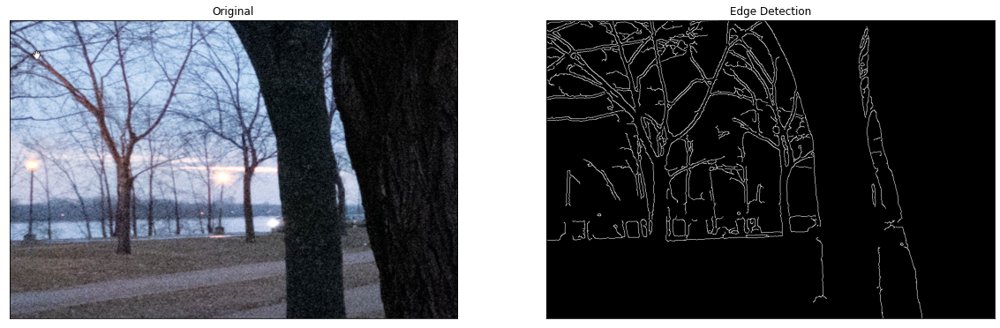

In [79]:
p1.plt_comp("edge detection")

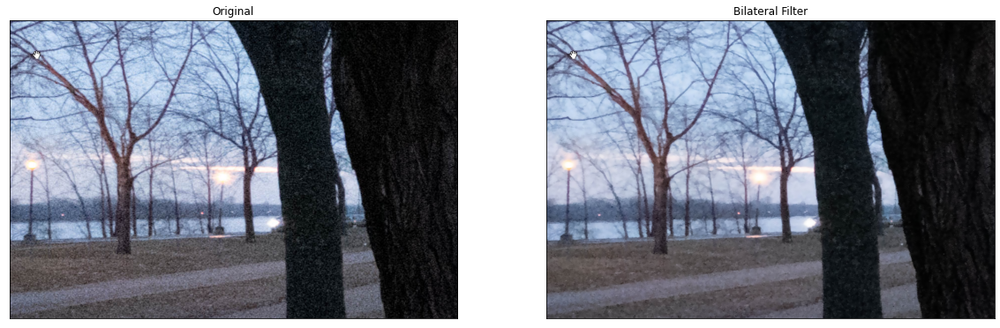

In [80]:
p1.plt_comp("bilateral")

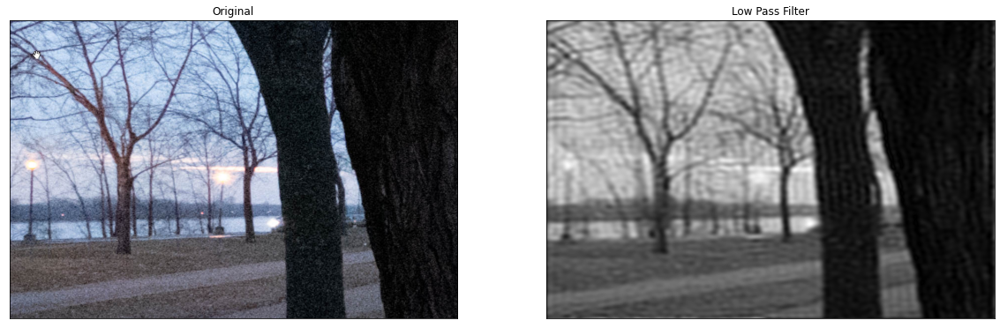

In [81]:
p1.plt_comp('low pass')

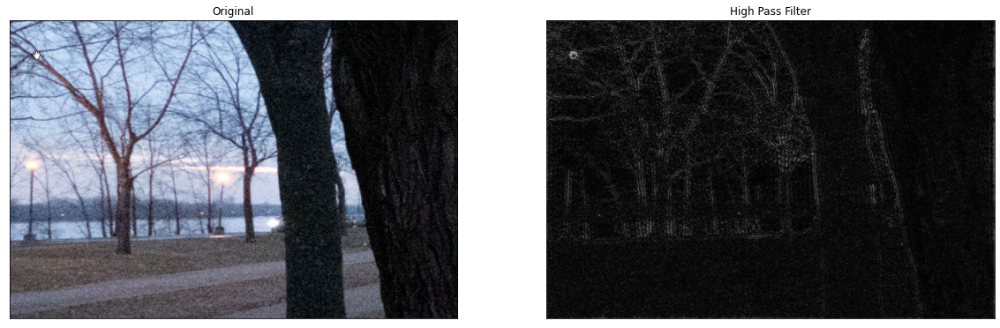

In [82]:
p1.plt_comp("High pass filter")

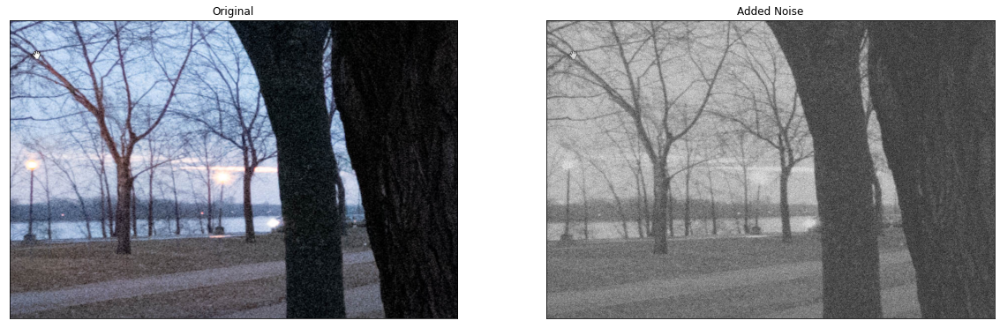

In [97]:
p1.plt_comp("add noise")

In [351]:
p2 = filters("leaves.jpg",9,40)

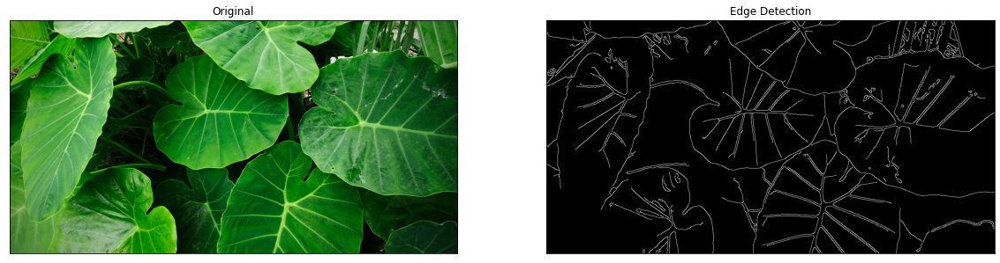

In [352]:
p2.plt_comp('edge detection')

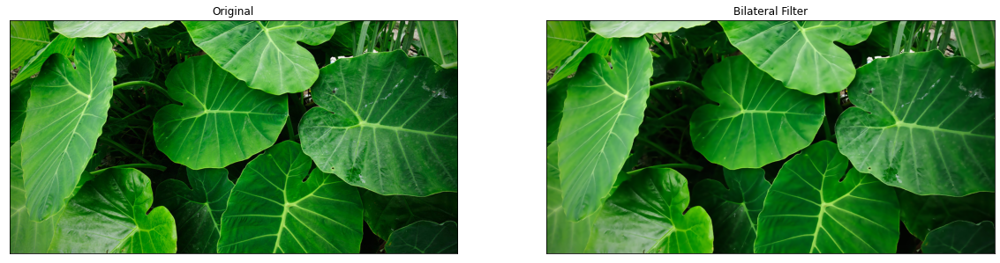

In [336]:
p2.plt_comp("bilateral")

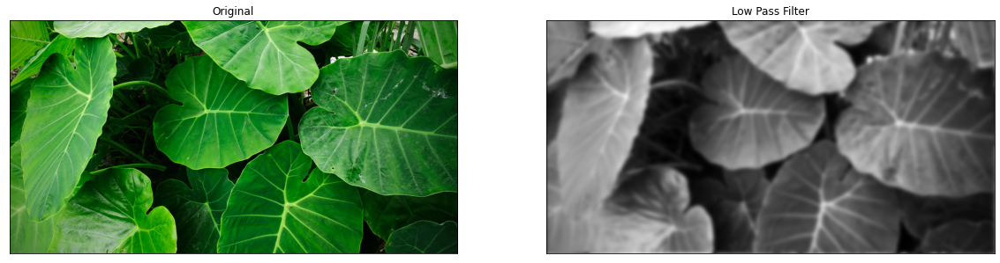

In [333]:
p2.plt_comp("low pass filter")

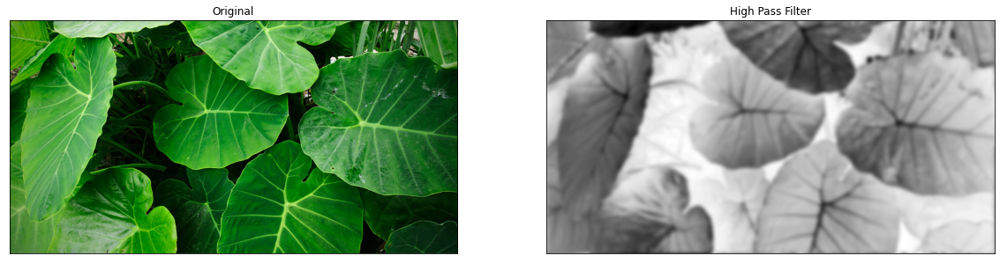

In [334]:
p2.plt_comp("high pass filter")

### Gaussian Noise Adder

### Reference
https://www.youtube.com/watch?v=-Vk23ye2o_I

In [88]:
def noise_adder(image):
    f = cv2.imread(image, 0)
    f = f/255 
    x, y = f.shape
    mean = 0
    var = 0.01
    sigma = np.sqrt(var)
    n = np.random.normal(loc=mean, scale=sigma, size=(x,y))
    return f + n

In [89]:
noise = noise_adder("leaves.jpg")

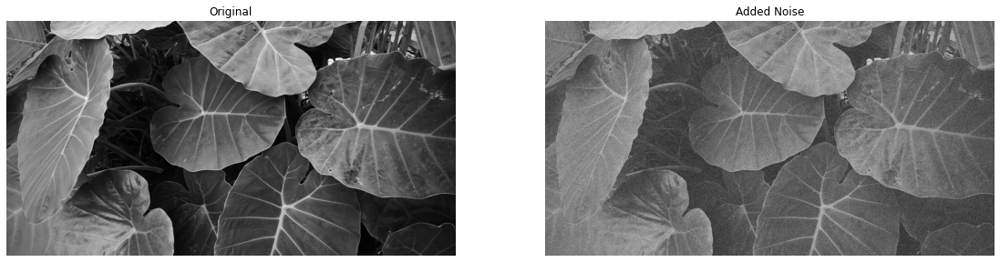

In [90]:
plt.figure(figsize=(30,20))
plt.subplot(131), plt.imshow(gray_img, cmap='gray'),plt.title('Original')
plt.axis('off')
plt.subplot(132), plt.imshow(noise , cmap='gray'),plt.title('Added Noise')
plt.axis('off')
plt.show()